# Installation

In [ ]:
!pip install --upgrade diffusers accelerate transformers gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.5/16.5 MB 67.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.9/92.9 kB 12.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.9/302.9 kB 32.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.0/75.0 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 71.0 MB

# Stable Diffusion Pipeline

In [ ]:
from diffusers import DiffusionPipeline
import torch

pipeline = DiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    use_safetensors=True,
    torch_dtype=torch.float16,
).to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


## Image generation (Text 2 Image)

https://huggingface.co/docs/diffusers/api/pipelines/stable_diffusion/text2img

  0%|          | 0/50 [00:00<?, ?it/s]

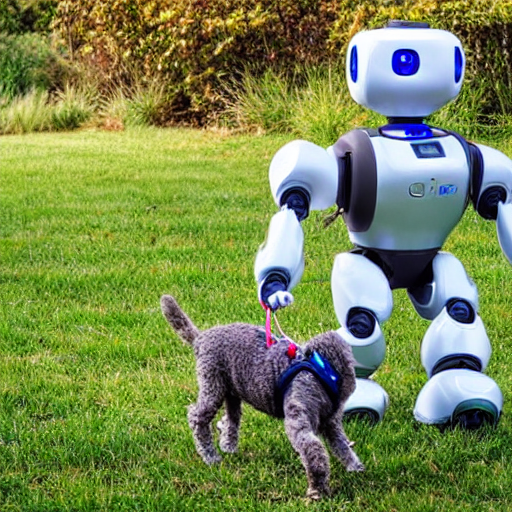

In [ ]:
pipeline("A robot walking the dog").images[0]

## LORA

1. Download a LORA model (e.g. from CivitAI
https://civitai.com/models/183161/luxury-boat-yacht-lora)
2. Upload the model to your Google Drive
3. Mount Google Drive in Google Colab
4. Fix the path below

In [ ]:
pipeline.load_lora_weights("./drive/MyDrive/LuxuryBoatYacht.safetensors")

/usr/local/lib/python3.10/dist-packages/diffusers/loaders/lora.py:708: FutureWarning: `_modify_text_encoder` is deprecated and will be removed in version 0.25. You are using an old version of LoRA backend. This will be deprecated in the next releases in favor of PEFT make sure to install the latest PEFT and transformers packages in the future.
  deprecate("_modify_text_encoder", "0.25", LORA_DEPRECATION_MESSAGE)
/usr/local/lib/python3.10/dist-packages/diffusers/loaders/lora.py:679: FutureWarning: `_remove_text_encoder_monkey_patch_classmethod` is deprecated and will be removed in version 0.25. You are using an old version of LoRA backend. This will be deprecated in the next releases in favor of PEFT make sure to install the latest PEFT and transformers packages in the future.
  deprecate("_remove_text_encoder_monkey_patch_classmethod", "0.25", LORA_DEPRECATION_MESSAGE)


In [ ]:
generator = torch.Generator("cuda").manual_seed(142000)
from diffusers.utils import make_image_grid

output = pipeline(
    ['Yacht , sea , sky , black , very high quality , blue sky , turquoise sea, closeup']*4,
    generator=generator
)


  0%|          | 0/50 [00:00<?, ?it/s]

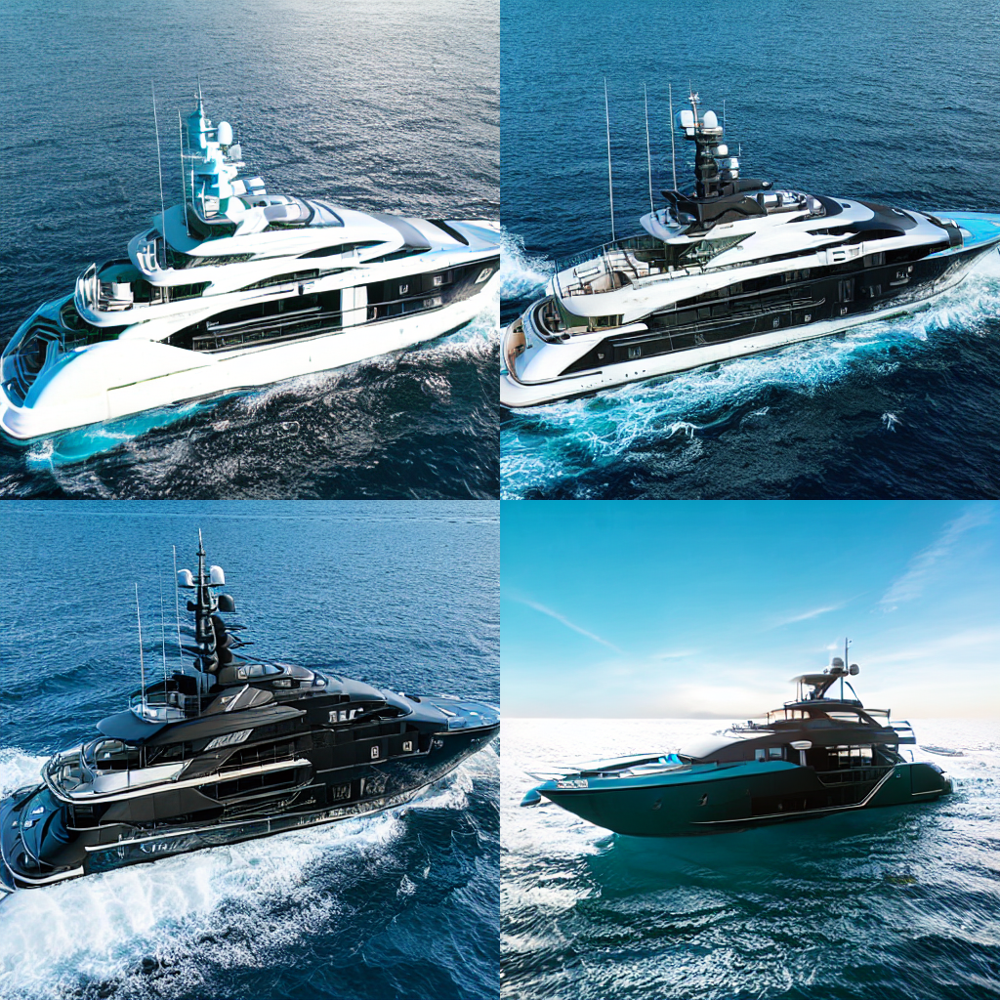

In [ ]:
make_image_grid(output["images"], 2, 2)

In [ ]:
pipeline.unload_lora_weights()

You are using `unload_lora_weights` to disable and unload lora weights. If you want to iteratively enable and disable adapter weights,you can use `pipe.enable_lora()` or `pipe.disable_lora()`. After installing the latest version of PEFT.


# ControlNet

In [ ]:
!pip install controlnet-aux==0.0.7

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.4/202.4 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 45.4 MB/s eta 0:00:00
  Created wheel for controlnet-aux: filename=controlnet_aux-0.0.7-py3-none-any.whl size=274340 sha256=882d686951c3299c40834ddf16572a387044f30286968428bb17c77520743604
  Stored in directory: /root/.cache/pip/wheels/1e/3e/93/6678b4c0bc2ec31d53409b25d4189cbb08bae843e8b2b78e52
Successfully built controlnet-aux


## Canny

Upload a picture with a person to Google Colab and fix the path accordingly

Use https://birme.net to crop the picture to 512x512

/usr/local/lib/python3.10/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/usr/local/lib/python3.10/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_11m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_11m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.

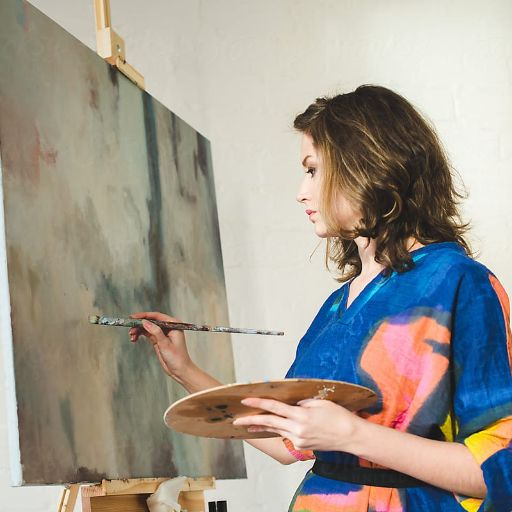

In [ ]:
from controlnet_aux.processor import Processor
from PIL import Image

img = Image.open("./1850739.jpg").convert("RGB").resize((512, 512))
img

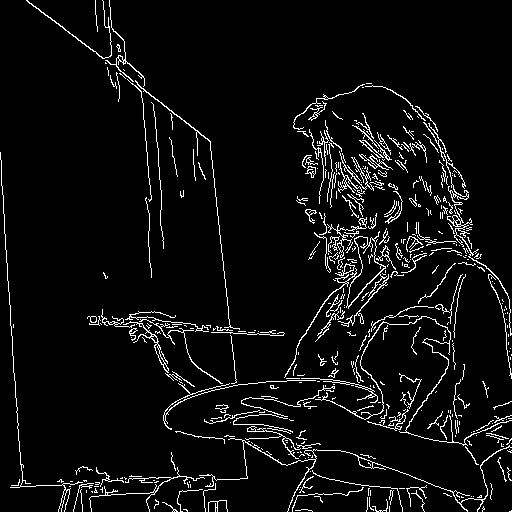

In [ ]:

# img
# # load processor from processor_id
# # options are:
# # ["canny", "depth_leres", "depth_leres++", "depth_midas", "depth_zoe", "lineart_anime",
# #  "lineart_coarse", "lineart_realistic", "mediapipe_face", "mlsd", "normal_bae", "normal_midas",
# #  "openpose", "openpose_face", "openpose_faceonly", "openpose_full", "openpose_hand",
# #  "scribble_hed, "scribble_pidinet", "shuffle", "softedge_hed", "softedge_hedsafe",
# #  "softedge_pidinet", "softedge_pidsafe", "dwpose"]
processor_id = 'canny'
processor = Processor(processor_id)

processed_image = processor(img, to_pil=True)
processed_image

In [ ]:
import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

controlnet15 = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float16
).to("cuda")

pipe15 = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet15,
    torch_dtype=torch.float16
).to("cuda")

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

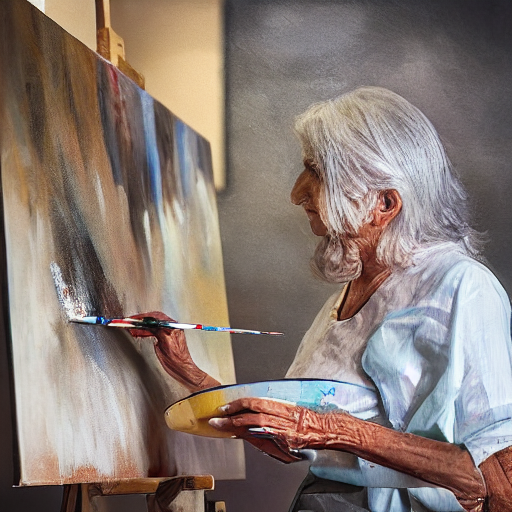

In [ ]:
pipe15(
    "professional photo of an old woman painting a picture",
    image=processed_image
).images[0]

# Stable Diffusion XL

## Image Generation (Text 2 Image)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

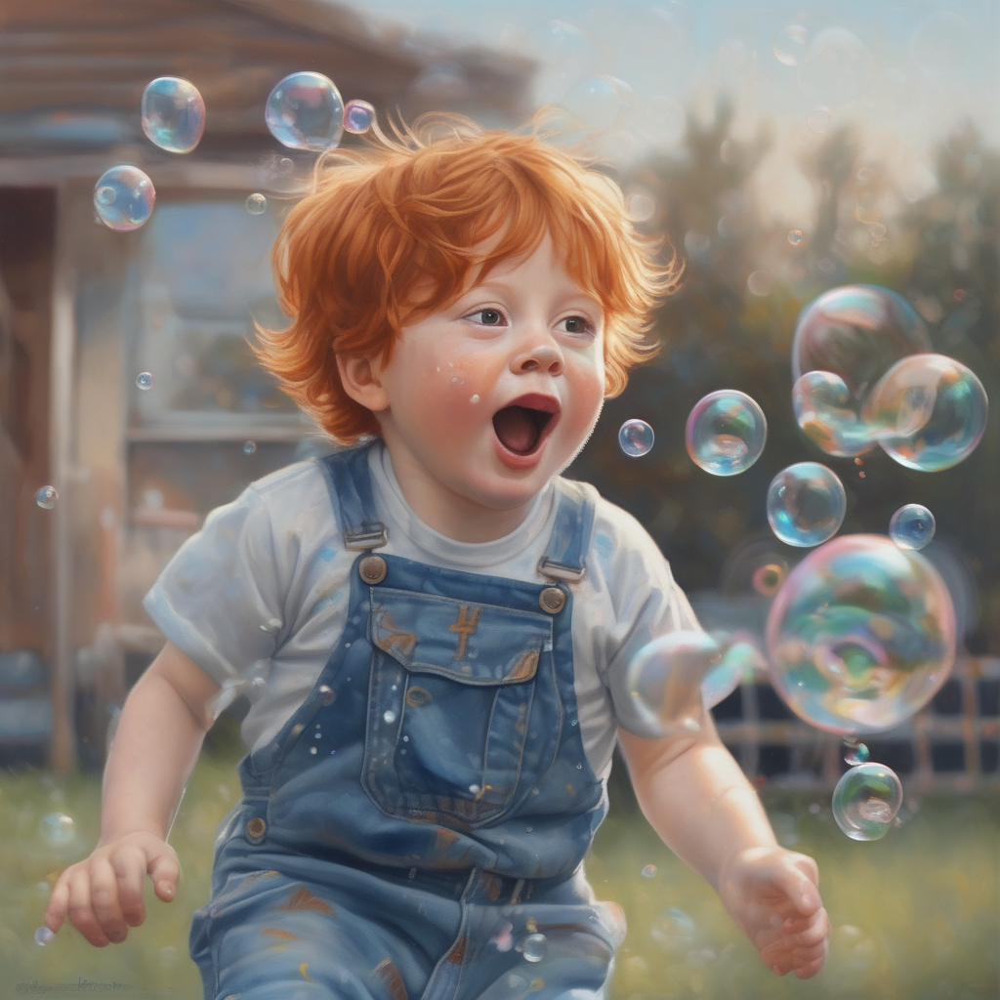

In [ ]:
from diffusers import AutoPipelineForText2Image
import torch

generator = torch.Generator("cuda").manual_seed(420)

pipeline_text2image = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

pipeline_text2image(
    'a little boy with ginger hair wearing denim overalls chasing bubbles. clean pastel painting, beautiful detailed face, lots of bubbles, photorealistic',
    generator=generator
).images[0]

## Image Generation + Refiner

In [ ]:
from diffusers import DiffusionPipeline


refiner = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0",
    text_encoder_2=pipeline_text2image.text_encoder_2,
    vae=pipeline_text2image.vae,
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
).to("cuda")



Fetching 9 files:   0%|          | 0/9 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

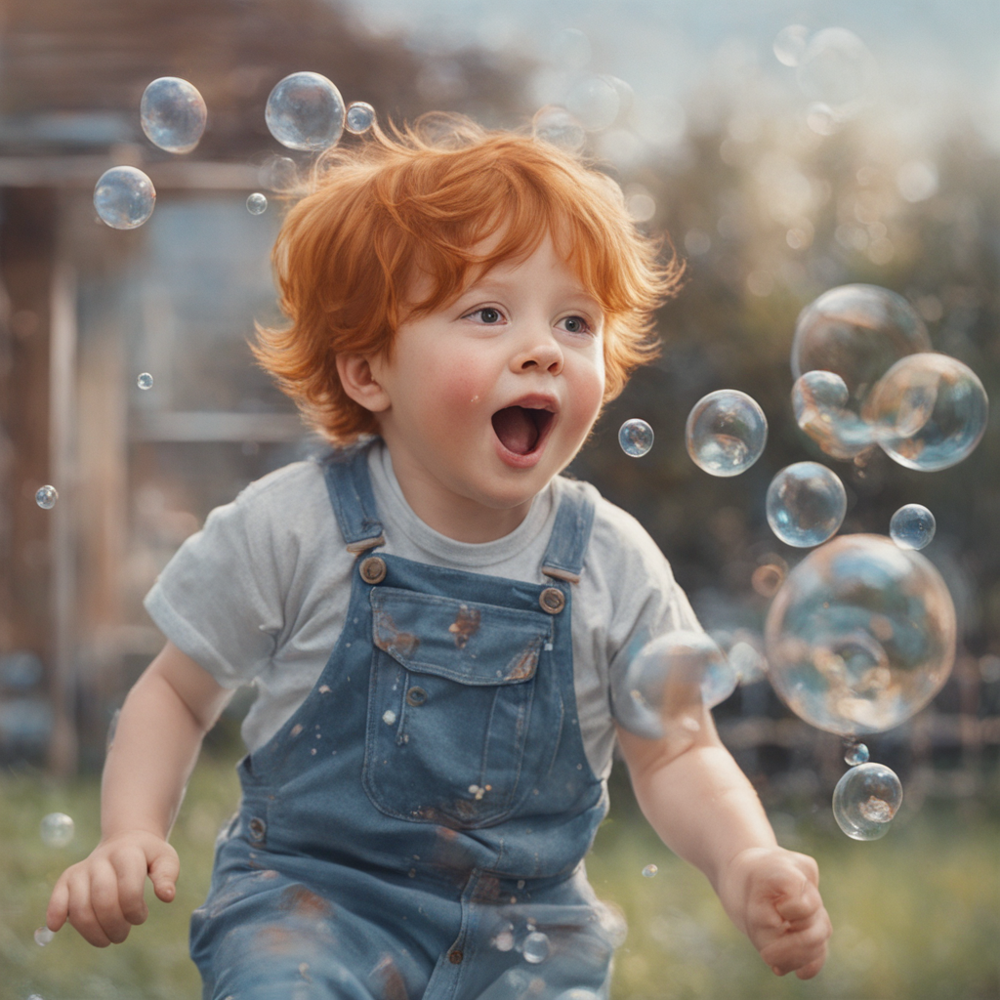

In [ ]:
generator = torch.Generator("cuda").manual_seed(420)

prompt = 'a little boy with ginger hair wearing denim overalls chasing bubbles. clean pastel painting, beautiful detailed face, lots of bubbles, photorealistic'

image = pipeline_text2image(
    prompt,
    generator=generator,
    denoising_end=0.8,
    output_type="latent"
).images

refiner(prompt="photo of a little boy in a garden",
        image=image,
        denoising_start=0.8,
        num_inference_steps=40
).images[0]


In [ ]:
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image

pipeline = AutoPipelineForInpainting.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True
).to("cuda")

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

## Inpainting

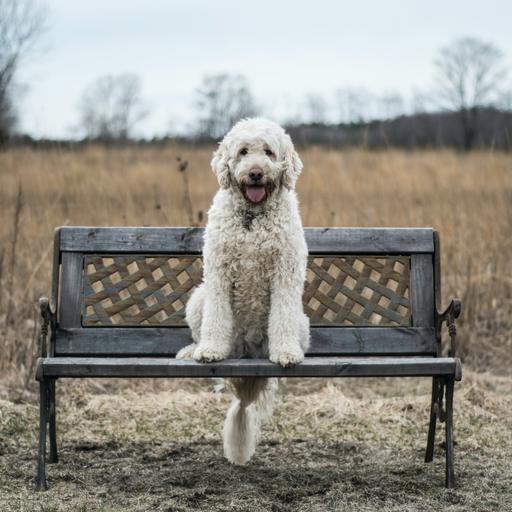

In [ ]:
from diffusers.utils import load_image

img_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo.png"
mask_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png"

init_image = load_image(img_url).convert("RGB")
mask_image = load_image(mask_url).convert("RGB")

init_image

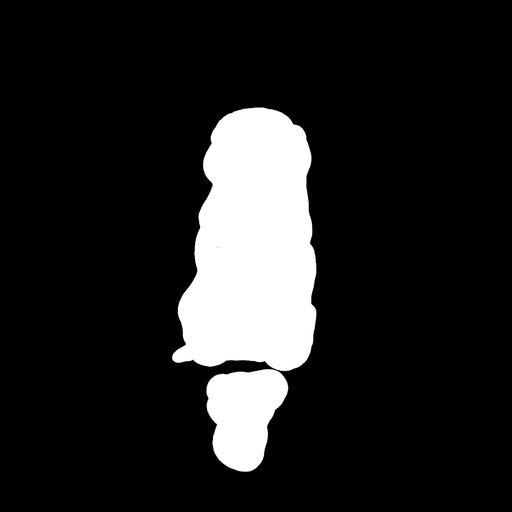

In [ ]:
mask_image

  0%|          | 0/40 [00:00<?, ?it/s]

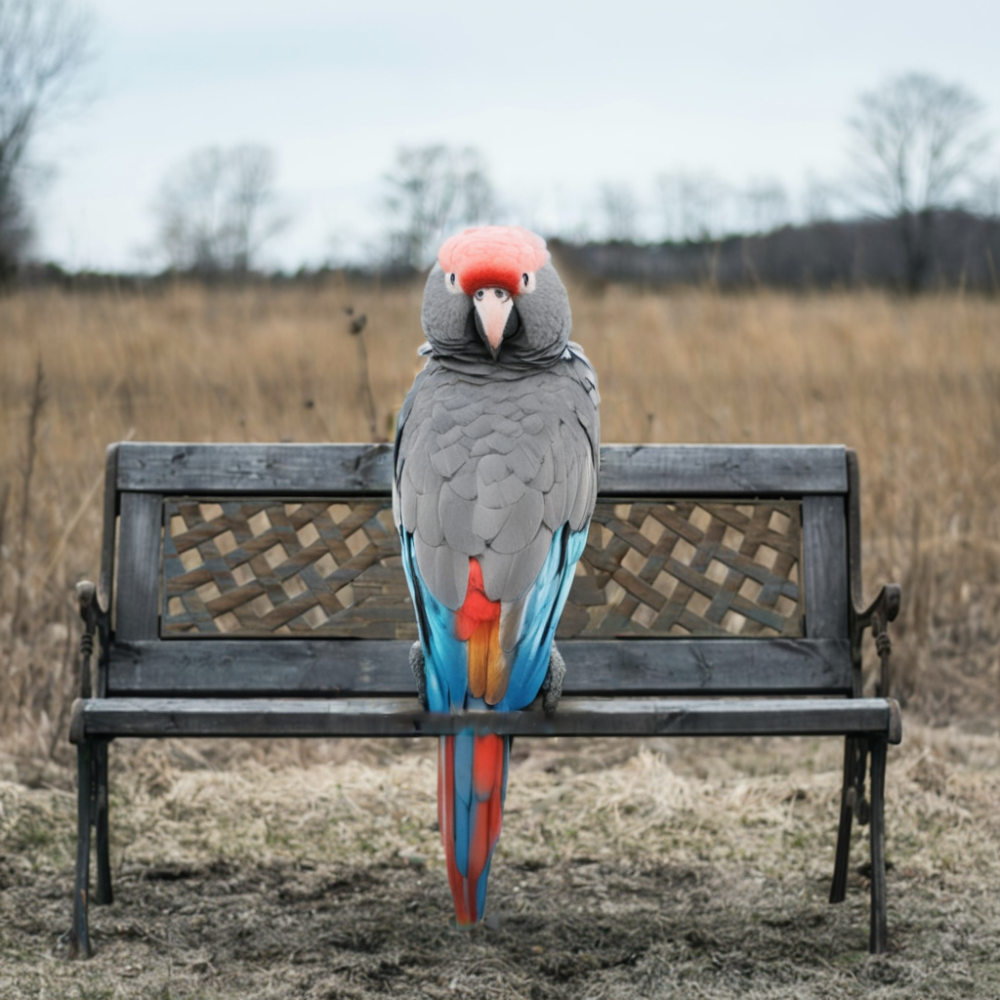

In [ ]:
image = pipeline("Big parrot sitting on a bench", image=init_image, mask_image=mask_image, num_inference_steps=50, strength=0.80).images[0]
image